# Face Recognition Sytem

Authors: Florian BARRAL,

# OUTLINE//Pipeline of a face recognition system:
## 0. Importing Environment
## 1. [Face Detection] Let's detect face(s) on image
###    1. Use SaaS online to do it
###    2. Test Haar Cascade
###    3. Test Deeplearning base technique
## 2. [Face Feature Extraction] Let's encode our images in a high level feature space
###     1. Image loading & preprocessing
###     2. Image to encoding with CNNs
####         1. Test different CNNs 
####         2. Choose the best CNN
## 3. [Face Identification] Let's identify faces by working with encodings
###     1. Deterministic approach
One reference image for each person
####         1. Face verification 1:1
####         2. Face identification 1:N
Multiple references images for each person: works also with barycenters of encodings of same persons
###     2. Learning approach
Multiple references images for each person want to be even more precise.
####         1. SVM classification to train
####         2. Use trained SVM & output the face)
        
## 4. [BONUS] Analyse impact & distance accuracy 
using cosine or L2 or L1 or Chi2, etc.

## 0. Importing Environment

In [1]:
import os

import random
import numpy as np

import keras

Using TensorFlow backend.
/usr/local/Cellar/python/3.7.0/Frameworks/Python.framework/Versions/3.7/lib/python3.7/importlib/_bootstrap.py:219: RuntimeWarning: compiletime version 3.6 of module 'tensorflow.python.framework.fast_tensor_util' does not match runtime version 3.7
  return f(*args, **kwds)


In [2]:
from matplotlib import pyplot as plt
%matplotlib inline

# following packages are used to visualize nicely the NN layers :) especially the ones of residual & inceptions NN
from keras.utils import plot_model

from keras.utils.vis_utils import model_to_dot
from IPython.display import SVG
os.environ["PATH"] += os.pathsep + 'C:/Program Files (x86)/Graphviz2.38/bin/'

In [3]:
!ls FRmodel

In [9]:
from IPython.core.display import Image, display

## 1. [Face Detection] Let's detect face(s) on image


###    1. Face Detection with OpenCV


In [12]:
#code to import


### 2. Face Dection manually

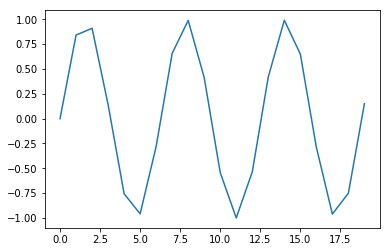

In [10]:
from matplotlib import pyplot as plt
import numpy as np
fig = plt.figure()
x=np.arange(0,20)
y=np.sin(x)
plt.plot(x,y)
xdata = ydata = None
def onclick(event):
    global xdata, ydata
    xdata, ydata = event.xdata, event.ydata
    print ('xdata=%f, ydata=%f' % (xdata, ydata))
    return ('xdata=%f, ydata=%f' % (xdata, ydata))
cid = fig.canvas.mpl_connect('button_press_event', onclick)
plt.show() 
 


### Faces detected & cropped!
Let's assume a very well trained Viola Jones has been applied on our images in ./images/original

The outputs ie faces detected & cropped have been saved in ./images/processed. They're square images of 224x224 in RGB.

## 2. [Face Encoding] Let's encode our images in a high level feature space


As pixels space it's not a relevant space to compare easily images (reshaped as vectors) because:
- it has too many dimensions (224x224x3=150528 coordinates!) 
- and it does not take into account global physical characteristics of a face (the surrounding of a black pixel of an eye will be not be compared to the different surrounding of a black pixel of a beauty spot)

we'll build a more accurate space (smaller and with high level features) like we've seen in the course. Note: the built space is an Euclidian space.

<center><img src="CNN_pixels_to_encoding_space.png" style="width:800px"></center>

###     1. Image loading & preprocessing


In [4]:
# packages for preprocessing images & visualize them
from keras.preprocessing import image
from keras.applications.vgg16 import preprocess_input
import matplotlib.pyplot as plt

In [5]:
# let's define a function that preprocessed the image in an array ready to go through the nn
def img_preprocessed(img_path):
    # reshape
    img = image.load_img(img_path, target_size=(224, 224)) #images are already 224 x 224 but just in case 
    img = image.img_to_array(img)
    img = np.expand_dims(img, axis=0)
    img = preprocess_input(img)
    
    return img

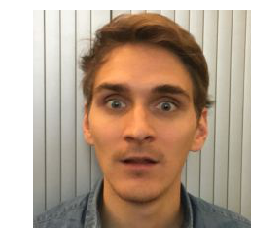

Adrien's face is actually an array of (1, 224, 224, 3) dimensions


In [6]:
# example
img_path="./images/processed/ref/adrien_s_4.jpg"
plt.axis('off')
plt.imshow(image.load_img(img_path, target_size=(224, 224)))
plt.show()
img= img_preprocessed(img_path)
print("Adrien's face is actually an array of "+str(img.shape)+" dimensions")

###     2. Image to encoding with CNNs


**Objective: Convert the raw image to an encoding.**

*How:* by learning a new vector space where we can easily compare similarity faces from 2 different images with simple operations: element-wise comparison operation applied on related vectors.

Finding the correct vector space + learn the encoder can be done with CNNs. Yet the pain point is to find & use the correct CNNs. 
By correct CNNs, we mean the CNNs with:
- correct architecture for a Multiclass Classification learning or a Deep Metric Learning
- trained on a correct dataset
- with a way of learning (good choice of hyperparameters,etc.)


As seen in the course, with the classic approach of Multiclass classification learning, we can:
- train a CNN from scratch
- do transfer learning from pretrained CNNs
    - fine tuning
    - lazy use: use it as it stands & it works [WE ARE GOING TO DO SO]
    
In this case, we assume the layers before the classifier are a good approximation of a high level feature space of the images of the training set.
    
Note we can do transfer learning on CNNs that were trained wit the approach of Deep Metric Learning (by ensuring that distances between different cats are high and distance between similar cats are small). 

####         2.2.1. Import different CNNs 


Assuming a correct architecture has been chosen, we'll try to understand in following cells the importance of the dataset on which the CNN will be trained..
We'll test different architectures trained on different datasets. And see the results.

#### 2.2.1.1. Import pre-trained neural networks ResNet50 trained on Imagenet (not faces images)

In [7]:
# Based on ResNet50 architecture trained on ImageNet
resnet50_imgnet = keras.applications.resnet50.ResNet50(weights='imagenet', 
                                                       include_top=False, 
                                                       input_shape=(224, 224, 3),
                                                       pooling='avg')

UnboundLocalError: local variable 'a' referenced before assignment

#### 2.2.1.2. Import pre-trained neural networks VGG16 trained on Imagenet (not faces images)

In [25]:
# Based on VGG16 architecture -> paper(2015)
vgg16_imgnet = keras.applications.vgg16.VGG16(weights='imagenet',
                                              include_top=False,
                                              input_shape=(224, 224, 3),
                                              pooling='avg')

By precising `include_top=False`, we specify we do not want as output a classifier vector (giving you probabilities of having Obama at 90%, Mandella at 9%, etc.) but instead  a features vector as output. 

#### 2.2.1.3. Import pre-trained neural networks ResNet50 trained on VGGFace2 (dataset of 3M faces)

Weights can be downloaded at: https://www.dropbox.com/s/40uo2llk6dvh3xl/VGGFace2_Keras.zip?dl=0 if folder `./VGGFace2_Keras` does not appear in the root of this notebook.

In [26]:
from VGGFace2_Keras.vggface2_resnet50 import Vggface2_ResNet50

resnet50_vggface2_raw = Vggface2_ResNet50(input_dim=(224, 224, 3), model_path='./VGGFace2_Keras/models/vggface2_resnet50.h5')
# print(vggface2_resnet50.summary())

UnboundLocalError: local variable 'a' referenced before assignment

Be sure to the take as output the features vector and not the classifier vector.

In [27]:
from keras.models import Model
resnet50_vggface2= Model(inputs=resnet50_vggface2_raw.input, outputs=resnet50_vggface2_raw.layers[-2].output)

NameError: name 'resnet50_vggface2_raw' is not defined

We have now 3 pretrained CNNs ready to use.

### 2.2.2. img2vec: find the encoding in the new vector space generated by CNN

In [69]:
## TYPE CODE 
# function 
def img2vec(img_path,model=vggface2_resnet50):
    ## TYPE CODE 
    img = img_preprocessed(img_path)
    img_encoding = model.predict(img)
    ## TYPE CODE 
    return img_encoding

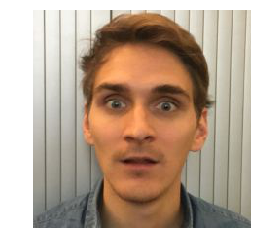

In [86]:
img_path="./images/processed/ref/adrien_s_4.jpg"
plt.axis('off')
plt.imshow(image.load_img(img_path, target_size=(224, 224)))

In [93]:
nb_coordinates_pre_model = img.shape[1]*img.shape[2]*img.shape[3]

img_post_vgg16_imgnet = img2vec(img_path,vgg16_imgnet)
img_post_resnet50_imgnet = img2vec(img_path,resnet50_imgnet)
img_post_resnet50_vggface2 = img2vec(img_path,resnet50_vggface2)

nb_coordinates_post_vgg16_imgnet = img_post_vgg16_imgnet.shape[1]
nb_coordinates_post_resnet50_imgnet= img_post_resnet50_imgnet.shape[1]
nb_coordinates_post_resnet50_vggface2 = img_post_resnet50_vggface2.shape[1]

print("PIXELS SPACE")
print("Image pre " + "MODEL" + " has shape " + str(img.shape) + " with "+str(nb_coordinates_pre_model) + " vector coordinates or features extracted..")
print("")
print("ENCODINGS SPACE or HIGH LEVEL FEATURE SPACE")
print("Let's compare the outputs of differents architectures trained on 2 different datasets")
print("Image post-"+ "'VGG16 IMAGENET'" + " has shape " +str(img_post_vgg16_imgnet.shape) + " with "+str(nb_coordinates_post_vgg16_imgnet) + " vector coordinates or features extracted.")
print("Image post-"+ "'RESNET50 IMAGENET'" + " has shape " +str(img_post_resnet50_imgnet.shape) + " with "+str(nb_coordinates_post_resnet50_imgnet) + " vector coordinates or features extracted.")
print("Image post-"+ "'RESNET50 VGGFACE2'" + " has shape " +str(img_post_resnet50_vggface2.shape) + " with "+str(nb_coordinates_post_resnet50_vggface2) + " vector coordinates or features extracted.")


PIXELS SPACE
Image pre MODEL has shape (1, 224, 224, 3) with 150528 vector coordinates or features extracted..

ENCODINGS SPACE or HIGH LEVEL FEATURE SPACE
Let's compare the outputs of differents architectures trained on 2 different datasets
Image post-'VGG16 IMAGENET' has shape (1, 512) with 512 vector coordinates or features extracted.
Image post-'RESNET50 IMAGENET' has shape (1, 2048) with 2048 vector coordinates or features extracted.
Image post-'RESNET50 VGGFACE2' has shape (1, 2048) with 2048 vector coordinates or features extracted.


We see that number of features extracted depend on the architecture selected but not the dataset.

### 1.3.0. Distance comparison between 2 images

Now let's define some distances to compare vectors in generated spaces by CNNs.

In [95]:
def euclidean_distance(im1, im2):
    dist = im1 - im2
    dist = np.sum(np.multiply(dist, dist))
    dist = np.sqrt(dist)
    return dist

We'll compare the distance between some faces using the different CNNs loaded and see what we can conclude.

In [116]:
im1_path = "./images/processed/ref/adrien_s_4.jpg"
im2_path = "./images/processed/ref/adrien_r_16.jpg"

In [117]:
def plot_images(im1_path,im2_path):
    f = plt.figure()
    f.add_subplot(1,2, 1)
    plt.imshow(image.load_img(im1_path, target_size=(224, 224)))
    plt.xticks([]); plt.yticks([])
    f.add_subplot(1,2, 2)
    plt.imshow(image.load_img(im2_path, target_size=(224, 224)))
    plt.xticks([]); plt.yticks([])
    plt.show(block=True)

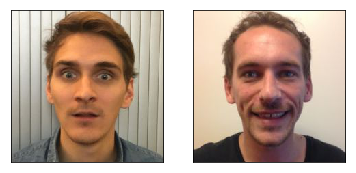

In [118]:
plot_images(im1_path,im2_path)

In [119]:
def comparing_distances_between_images(im1_path,im2_path,model=resnet50_vggface2):
    plot_images(im1_path,im2_path)
    # encoding these images: forward propagation through the NN
    im1_encoding =img2vec(im1_path, model)
    im2_encoding =img2vec(im2_path, model)

    print("Euclidian distance between these two images: "+str(euclidean_distance(im1_encoding,im2_encoding)))

Using 'VGG16 IMAGENET'


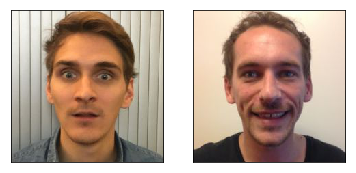

Euclidian distance between these two images: 52.02842

Using 'RESNET50 IMAGENET'


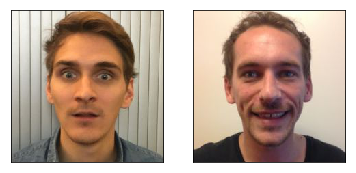

Euclidian distance between these two images: 24.502312

Using 'RESNET50 VGGFACE2'


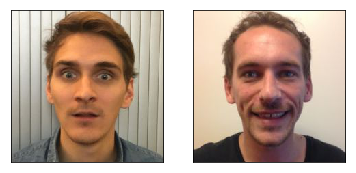

Euclidian distance between these two images: 116.84231


In [120]:
print("Using 'VGG16 IMAGENET'")
comparing_distances_between_images(im1_path,im2_path,vgg16_imgnet)

print("")
print("Using 'RESNET50 IMAGENET'")
comparing_distances_between_images(im1_path,im2_path,resnet50_imgnet)

print("")
print("Using 'RESNET50 VGGFACE2'")
comparing_distances_between_images(im1_path,im2_path,resnet50_vggface2)

**Observations**

RESNET50 is more complex than VGG16. But when both are trained VGG16 is better.
However RESNET50 trained on VGG16 is way more efficient than VGG16.

We see that using a more complex architecture of CNN does not ensure your to have relevant encodings if you train it on a dataset that has no relation to the final use of your CNN (which is encoding a face). Take a look at http://www.image-net.org/ you'll see what images compose the ImageNet dataset.

####         2. Choose the best CNN


To be sure to choose the most relevant CNN of our shortlist, let's scan more different faces but also same faces.

Choose who you wanna compare to all the other Data Scientists of Capgemini Invent. Find below a list of DS. 

In [124]:
!ls "./images/processed/ref/

adrien_r_16.jpg
adrien_s_4.jpg
ambroise_p_9.jpg
arthur_b_2.jpg
benjamin_f_3.jpeg
charles_d_1.jpg
kim_m_12.jpg
matthias_d_7.jpg
olivier_a_10.jpg
zakaria_b_11.jpg


Let's take Ambroise by default! But you can change ;)

In [126]:
im1_path = "./images/processed/ref/ambroise_p_9.jpg"

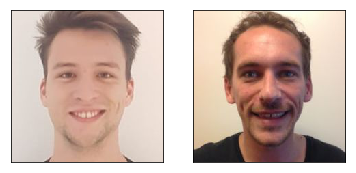

Euclidian distance between these two images: 40.489307


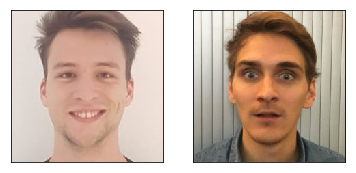

Euclidian distance between these two images: 51.958344


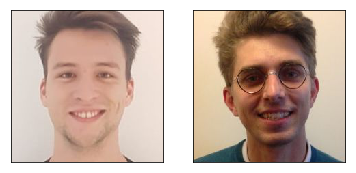

Euclidian distance between these two images: 43.768784


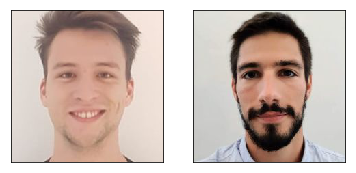

Euclidian distance between these two images: 49.66475


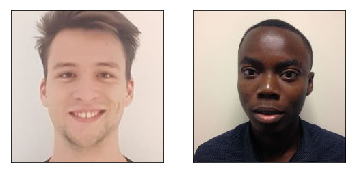

Euclidian distance between these two images: 43.53397


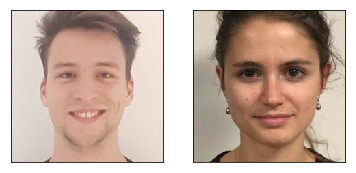

Euclidian distance between these two images: 30.032267


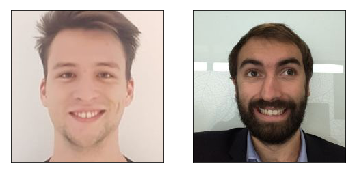

Euclidian distance between these two images: 45.923088


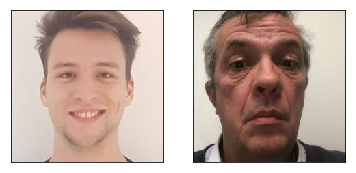

Euclidian distance between these two images: 35.553192


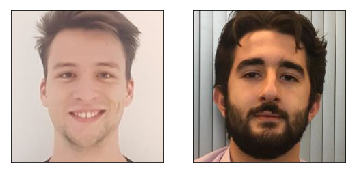

Euclidian distance between these two images: 53.51173


In [132]:
model = vgg16_imgnet
# distance comparison of all the Data Scientist of Capgemini Invent with your choosen pretrained model
for im2 in os.listdir("./images/processed/ref/") :
    im2_path = "./images/processed/ref/"+ im2
    if im1_path != im2_path:
        comparing_distances_between_images(im1_path,im2_path,model)   

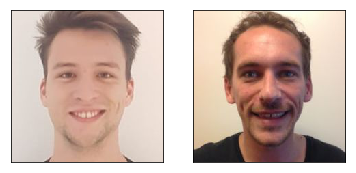

Euclidian distance between these two images: 127.059944


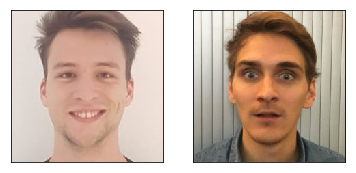

Euclidian distance between these two images: 131.32475


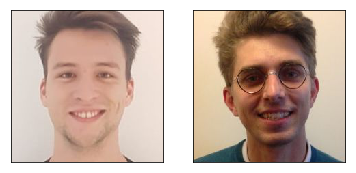

Euclidian distance between these two images: 125.54558


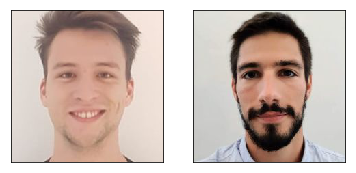

Euclidian distance between these two images: 137.12381


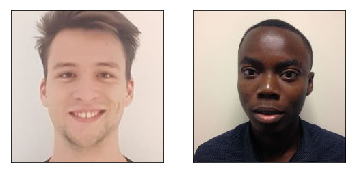

Euclidian distance between these two images: 136.10599


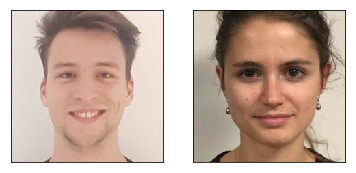

Euclidian distance between these two images: 131.9412


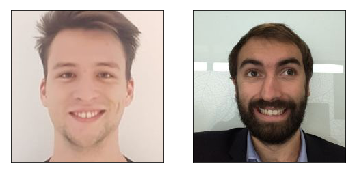

Euclidian distance between these two images: 134.76085


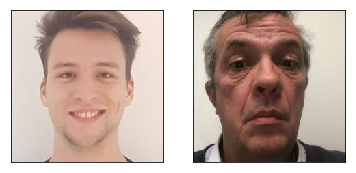

Euclidian distance between these two images: 135.65558


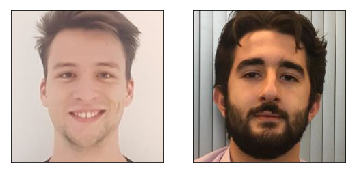

Euclidian distance between these two images: 131.11919


In [134]:
model = resnet50_vggface2 #resnet50_imgnet
# distance comparison of all the Data Scientist of Capgemini Invent with your choosen pretrained model
for im2 in os.listdir("./images/processed/ref/") :
    im2_path = "./images/processed/ref/"+ im2
    if im1_path != im2_path:
        comparing_distances_between_images(im1_path,im2_path,model)   

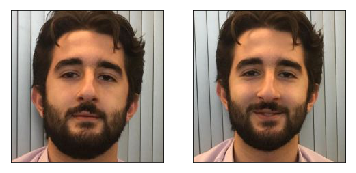

Euclidian distance between these two images: 28.481836


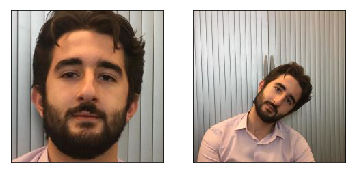

Euclidian distance between these two images: 103.59374


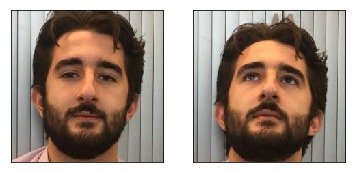

Euclidian distance between these two images: 48.7433


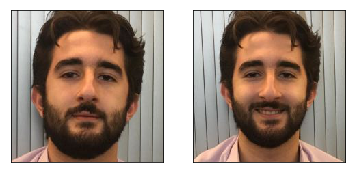

Euclidian distance between these two images: 32.5265


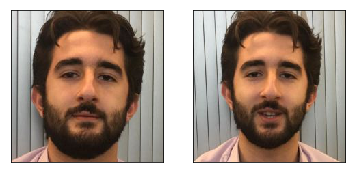

Euclidian distance between these two images: 34.615192


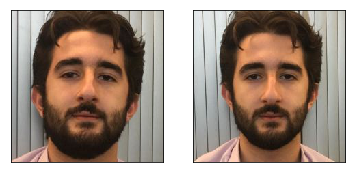

Euclidian distance between these two images: 35.794308


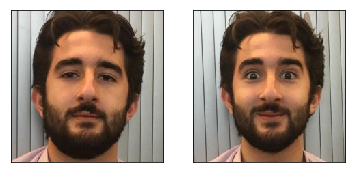

Euclidian distance between these two images: 54.671402


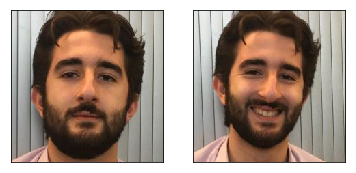

Euclidian distance between these two images: 42.188847


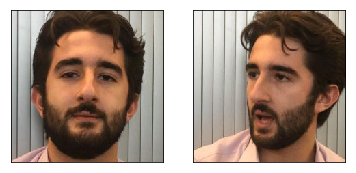

Euclidian distance between these two images: 63.596294


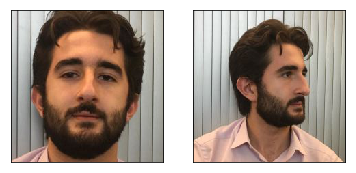

Euclidian distance between these two images: 93.45499


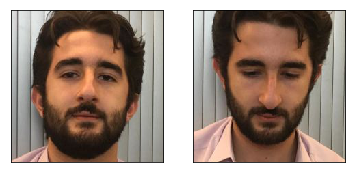

Euclidian distance between these two images: 53.848816


In [145]:
# distance comparison of all test and ref images from a SAME person
person = "zakaria_b"
ref_person = [f for f in os.listdir("./images/processed/ref/") if person in f]
test_person = [f for f in os.listdir("./images/processed/test/") if person in f]

im1_path = "./images/processed/ref/"+ ref_person[0] #actually there's only one picture of each data scientist in ref folder
for im2 in test_person :
    im2_path = "./images/processed/test/"+ im2
    comparing_distances_between_images(im1_path,im2_path,resnet50_vggface2)   

ResNet50 pretrained on VGGFace2 seems to generate a good Euclidian space where face similarity correlates with distance of encoded face vectors. 
I think we have a good pre trained CNN then. Let's try to build a classifier now and confirm with expected outputs.

## 3. [Face Identification] Let's identify faces by working with encodings


Note tp start we have only one image reference for each person. We'll analyse similarity of encoded vectors.

###     1. Deterministic approach


####         1. Face verification 1:1


In [147]:
def face_verification(img_path, ref_img_path, model=vggface2_resnet50_last_fc):
    
    # plotting these images side by side
    f = plt.figure()
    f.add_subplot(1,2, 1)
    plt.imshow(image.load_img(img_path))
    plt.gca().set_title('Face to check')
    plt.xticks([]); plt.yticks([])
    f.add_subplot(1,2, 2)
    plt.imshow(image.load_img(ref_img_path))
    plt.gca().set_title('Face of reference')
    plt.xticks([]); plt.yticks([])
    plt.show(block=True)
    
    # feature extraction of the image
    encoding = img2vec(img_path,model) 
    ref_encoding = img2vec(ref_img_path,model)
    
    
    dist = euclidean_distance(encoding,ref_encoding)
    
    if dist < 100: #threshold to fix better by iterations
        print("✔️ You're very similar to the face of reference. Access authorized! Please go find your beloved!")
        verification = True
    else:
        print("❌ You're so different from to the face of reference. Access unauthorized! Get out of here!")
        verification = False

    return verification

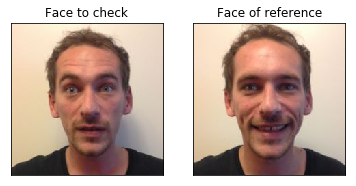

✔️ You're very similar to the face of reference. Access authorized! Please go find your beloved!


True

In [148]:
# example
face_verification("./images/processed/test/adrien_r_1.jpg", "./images/processed/ref/adrien_r_16.jpg", resnet50_vggface2)

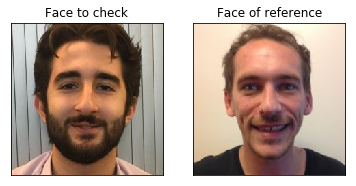

❌ You're so different from to the face of reference. Access unauthorized! Get out of here!


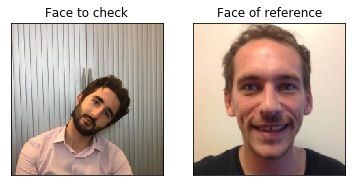

❌ You're so different from to the face of reference. Access unauthorized! Get out of here!


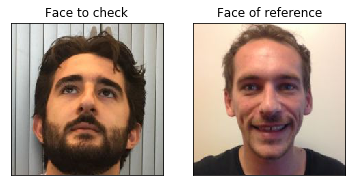

❌ You're so different from to the face of reference. Access unauthorized! Get out of here!


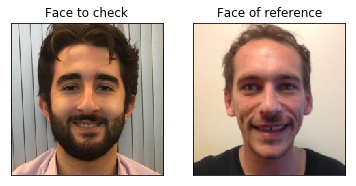

❌ You're so different from to the face of reference. Access unauthorized! Get out of here!


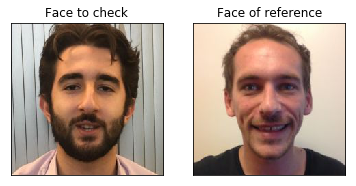

❌ You're so different from to the face of reference. Access unauthorized! Get out of here!


In [149]:
# face verification for same person (comparison of all test images with one single ref image)
im1_path = "./images/processed/ref/adrien_r_16.jpg"
stop_index = 4
i = 0
for im2 in test_person :
    im2_path = "./images/processed/test/"+ im2
    face_verification(im2_path, im1_path, vggface2_resnet50_last_fc)
    if i >= stop_index:
        break
    i += 1

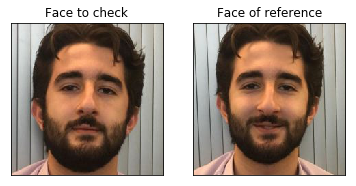

✔️ You're very similar to the face of reference. Access authorized! Please go find your beloved!


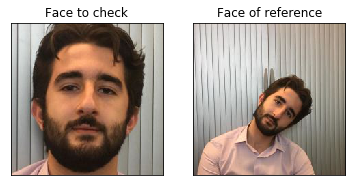

❌ You're so different from to the face of reference. Access unauthorized! Get out of here!


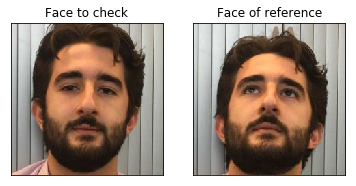

✔️ You're very similar to the face of reference. Access authorized! Please go find your beloved!


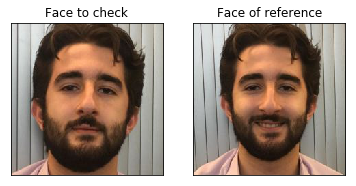

✔️ You're very similar to the face of reference. Access authorized! Please go find your beloved!


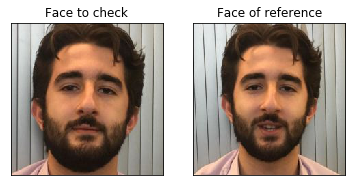

✔️ You're very similar to the face of reference. Access authorized! Please go find your beloved!


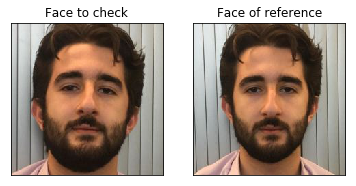

✔️ You're very similar to the face of reference. Access authorized! Please go find your beloved!


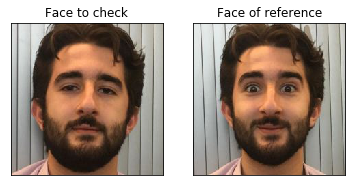

✔️ You're very similar to the face of reference. Access authorized! Please go find your beloved!


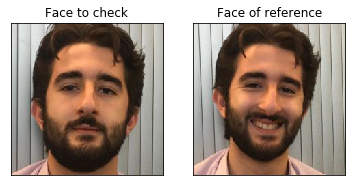

✔️ You're very similar to the face of reference. Access authorized! Please go find your beloved!


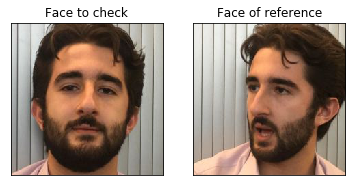

✔️ You're very similar to the face of reference. Access authorized! Please go find your beloved!


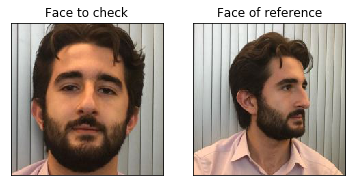

✔️ You're very similar to the face of reference. Access authorized! Please go find your beloved!


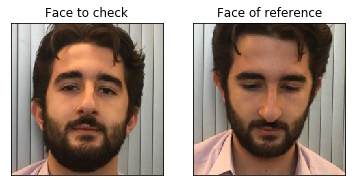

✔️ You're very similar to the face of reference. Access authorized! Please go find your beloved!


In [150]:
# distance comparison of all test and ref images from a SAME person
person = "zakaria_b"
ref_person = [f for f in os.listdir("./images/processed/ref/") if person in f]
test_person = [f for f in os.listdir("./images/processed/test/") if person in f]

im1_path = "./images/processed/ref/"+ ref_person[0] #actually there's only one picture of each data scientist in ref folder
for im2 in test_person :
    im2_path = "./images/processed/test/"+ im2
    face_verification(im1_path,im2_path,resnet50_vggface2)

####         2. Face identification 1:N
One reference image for each person
Multiple references images for each person: works also with barycenters of encodings of same persons

In [266]:
# building database: name, ref encoding 
ref_db={}
names=[
"adrien_r_",
"adrien_s_",
"ambroise_p_",
"arthur_b_",
"benjamin_f_",
"charles_d_",
"kimmmmmmmm_m_",
"matthias_d_",
"olivier_a_",
"zakaria_b_"]

for name in names:
    for f in os.listdir("./images/processed/ref/"):
        if name in f:
            img_path = "./images/processed/ref/" + f
            ref_db[name]=img2vec(img_path,resnet50_vggface2)

In [267]:
def capitalize(sample):
    name = " ".join(sample.split("_")).title()
    return name

In [268]:
def face_verification(img_path, ref_img_path, model=vggface2_resnet50_last_fc):
    
    # plotting these images side by side
    f = plt.figure()
    f.add_subplot(1,2, 1)
    plt.imshow(image.load_img(img_path))
    plt.gca().set_title('Face to check')
    plt.xticks([]); plt.yticks([])
    f.add_subplot(1,2, 2)
    plt.imshow(image.load_img(ref_img_path))
    plt.gca().set_title('Face of reference')
    plt.xticks([]); plt.yticks([])
    plt.show(block=True)
    
    # feature extraction of the image
    encoding = img2vec(img_path,model) 
    ref_encoding = img2vec(ref_img_path,model)
    
    dist = euclidean_distance(encoding,ref_encoding)
    
    if dist < 100: #threshold to fix better by iterations
        print("✔️ You're very similar to the face of reference. Access authorized! Please go find your beloved!")
        authorization = True
    else:
        print("❌ You're so different from to the face of reference. Access unauthorized! Get out of here!")
        authorization = False

    return authorization, success

In [305]:
def face_identification(img_path,database, model=resnet50_vggface2, plot=True):
    same_person = False 
    
    # plot the image to identify
    if plot:
        f = plt.figure()
        f.add_subplot(1,2, 1)
        plt.imshow(image.load_img(img_path))
        plt.gca().set_title('Face to check')
        plt.xticks([]); plt.yticks([])
    
    # feature extraction of the image
    encoding = img2vec(img_path,model) 
    
    # loop to compare with on all ref_encodings
    min_dist = 200
    for (name, ref_encoding) in database.items():
    
        dist = euclidean_distance(encoding,ref_encoding)
    
        if dist < min_dist:
                min_dist = dist
                identity = name
        
    if min_dist > 105:  #threshold to fix better by iterations
        plt.show(block=True) 
        identity = None
        if plot:
            print("❌ You are not similar to anyone in our database of reference images. Access unauthorized! Get out of here!")
        authorization = False
    else:
        for i in os.listdir("./images/processed/ref/"):
            if re.match(identity, i):
                ref_img_path = "./images/processed/ref/" + i
        # adding ref img to plotting
        if plot:
            f.add_subplot(1,2, 2)
            plt.imshow(image.load_img(ref_img_path))
            plt.gca().set_title('Face identified')
            plt.xticks([]); plt.yticks([])
            plt.show(block=True) 
            print("✔️ You've been recognized! You might be " + str(capitalize(identity)) + ". Access authorized! Please go find your beloved!")
        authorization = True
        if img_path[-14:-6] in identity:
            same_person = True  
    return identity, dist, authorization, same_person

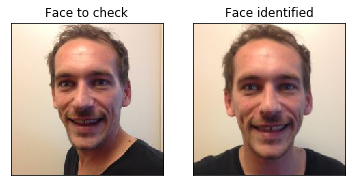

✔️ You've been recognized! You might be Adrien R . Access authorized! Please go find your beloved!


('adrien_r_', 115.58924, True, True)

In [306]:
# let's check one face
face_identification("./images/processed/test/adrien_r_10.jpg",ref_db,resnet50_vggface2)

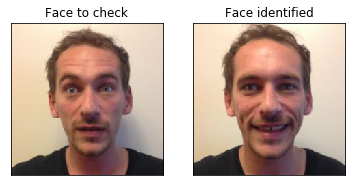

✔️ You've been recognized! You might be Adrien R . Access authorized! Please go find your beloved!


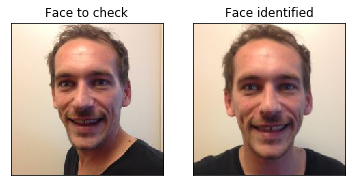

✔️ You've been recognized! You might be Adrien R . Access authorized! Please go find your beloved!


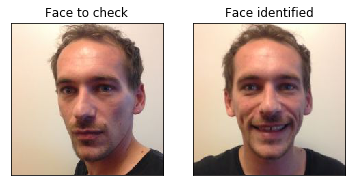

✔️ You've been recognized! You might be Adrien R . Access authorized! Please go find your beloved!


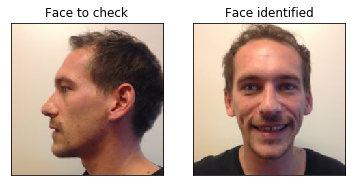

✔️ You've been recognized! You might be Adrien R . Access authorized! Please go find your beloved!


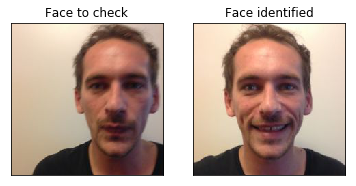

✔️ You've been recognized! You might be Adrien R . Access authorized! Please go find your beloved!


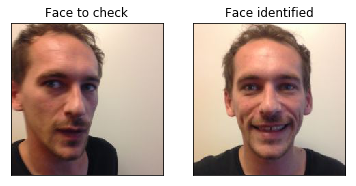

✔️ You've been recognized! You might be Adrien R . Access authorized! Please go find your beloved!


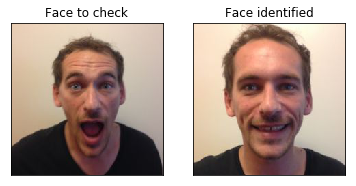

✔️ You've been recognized! You might be Adrien R . Access authorized! Please go find your beloved!


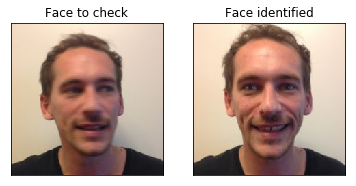

✔️ You've been recognized! You might be Adrien R . Access authorized! Please go find your beloved!


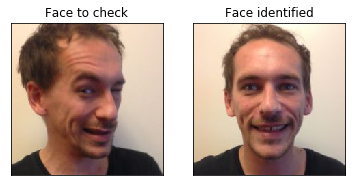

✔️ You've been recognized! You might be Adrien R . Access authorized! Please go find your beloved!


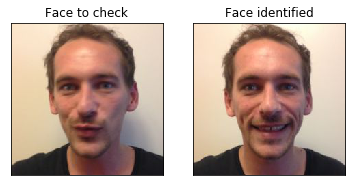

✔️ You've been recognized! You might be Adrien R . Access authorized! Please go find your beloved!


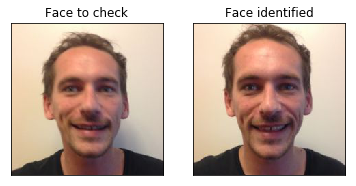

✔️ You've been recognized! You might be Adrien R . Access authorized! Please go find your beloved!


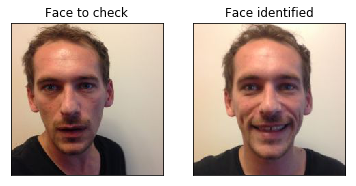

✔️ You've been recognized! You might be Adrien R . Access authorized! Please go find your beloved!


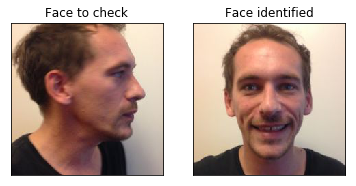

✔️ You've been recognized! You might be Adrien R . Access authorized! Please go find your beloved!


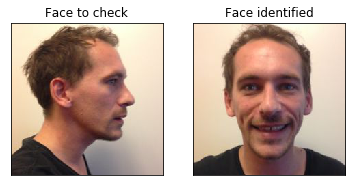

✔️ You've been recognized! You might be Adrien R . Access authorized! Please go find your beloved!


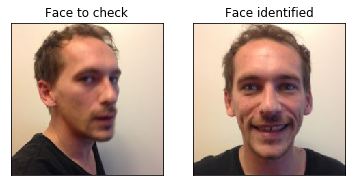

✔️ You've been recognized! You might be Adrien R . Access authorized! Please go find your beloved!


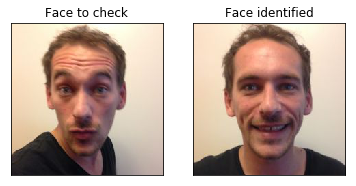

✔️ You've been recognized! You might be Adrien R . Access authorized! Please go find your beloved!


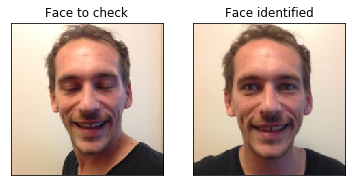

✔️ You've been recognized! You might be Adrien R . Access authorized! Please go find your beloved!


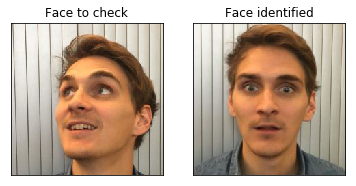

✔️ You've been recognized! You might be Adrien S . Access authorized! Please go find your beloved!


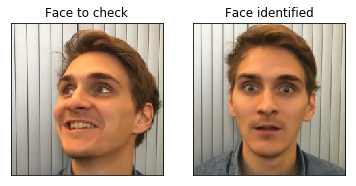

✔️ You've been recognized! You might be Adrien S . Access authorized! Please go find your beloved!


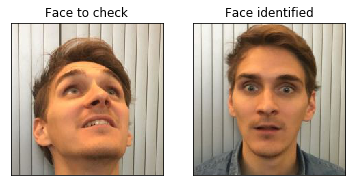

✔️ You've been recognized! You might be Adrien S . Access authorized! Please go find your beloved!


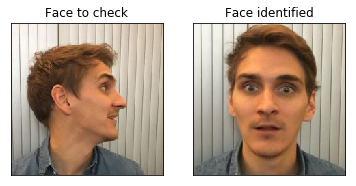

✔️ You've been recognized! You might be Adrien S . Access authorized! Please go find your beloved!


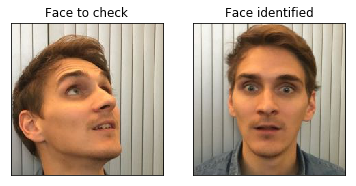

✔️ You've been recognized! You might be Adrien S . Access authorized! Please go find your beloved!


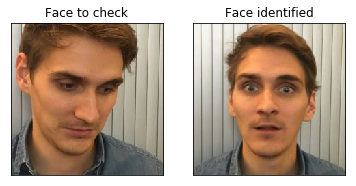

✔️ You've been recognized! You might be Adrien S . Access authorized! Please go find your beloved!


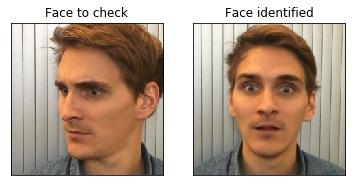

✔️ You've been recognized! You might be Adrien S . Access authorized! Please go find your beloved!


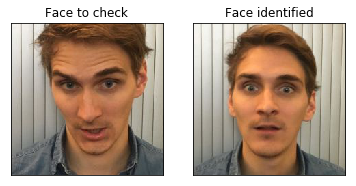

✔️ You've been recognized! You might be Adrien S . Access authorized! Please go find your beloved!


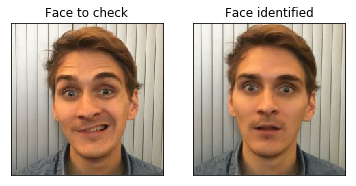

✔️ You've been recognized! You might be Adrien S . Access authorized! Please go find your beloved!


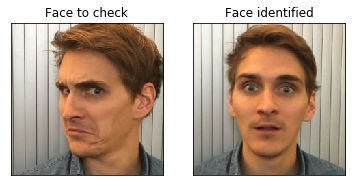

✔️ You've been recognized! You might be Adrien S . Access authorized! Please go find your beloved!


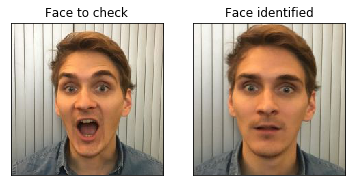

✔️ You've been recognized! You might be Adrien S . Access authorized! Please go find your beloved!


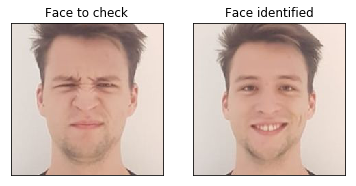

✔️ You've been recognized! You might be Ambroise P . Access authorized! Please go find your beloved!


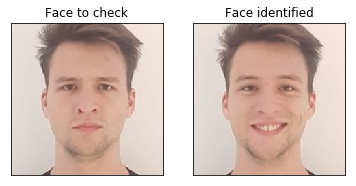

✔️ You've been recognized! You might be Ambroise P . Access authorized! Please go find your beloved!


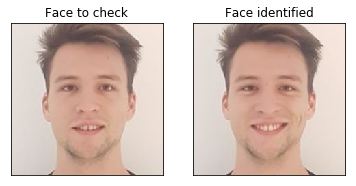

✔️ You've been recognized! You might be Ambroise P . Access authorized! Please go find your beloved!


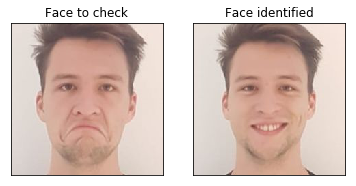

✔️ You've been recognized! You might be Ambroise P . Access authorized! Please go find your beloved!


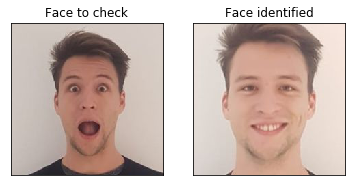

✔️ You've been recognized! You might be Ambroise P . Access authorized! Please go find your beloved!


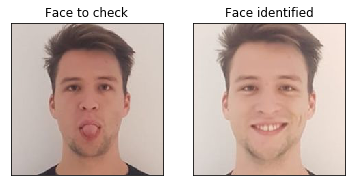

✔️ You've been recognized! You might be Ambroise P . Access authorized! Please go find your beloved!


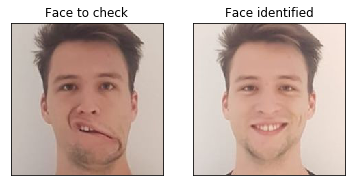

✔️ You've been recognized! You might be Ambroise P . Access authorized! Please go find your beloved!


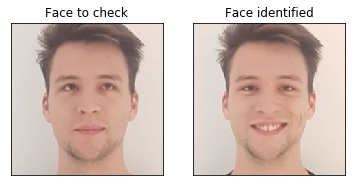

✔️ You've been recognized! You might be Ambroise P . Access authorized! Please go find your beloved!


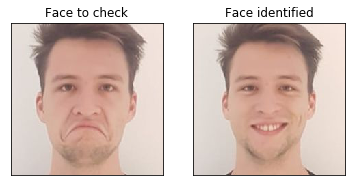

✔️ You've been recognized! You might be Ambroise P . Access authorized! Please go find your beloved!


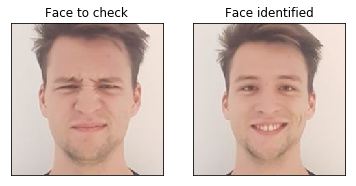

✔️ You've been recognized! You might be Ambroise P . Access authorized! Please go find your beloved!


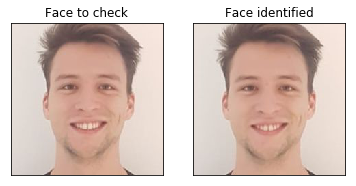

✔️ You've been recognized! You might be Ambroise P . Access authorized! Please go find your beloved!


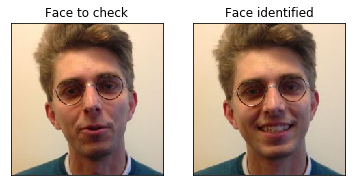

✔️ You've been recognized! You might be Arthur B . Access authorized! Please go find your beloved!


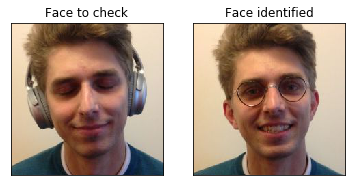

✔️ You've been recognized! You might be Arthur B . Access authorized! Please go find your beloved!


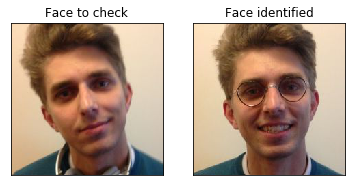

✔️ You've been recognized! You might be Arthur B . Access authorized! Please go find your beloved!


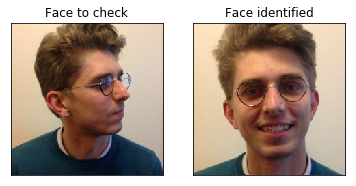

✔️ You've been recognized! You might be Arthur B . Access authorized! Please go find your beloved!


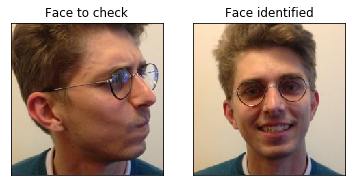

✔️ You've been recognized! You might be Arthur B . Access authorized! Please go find your beloved!


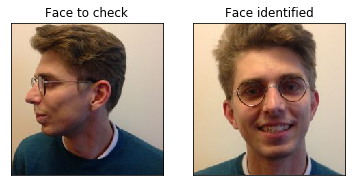

✔️ You've been recognized! You might be Arthur B . Access authorized! Please go find your beloved!


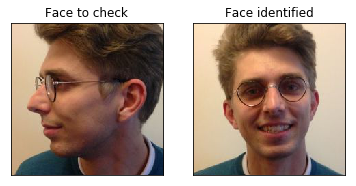

✔️ You've been recognized! You might be Arthur B . Access authorized! Please go find your beloved!


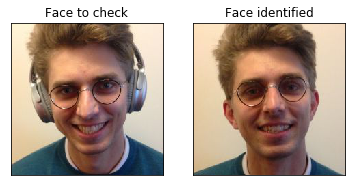

✔️ You've been recognized! You might be Arthur B . Access authorized! Please go find your beloved!


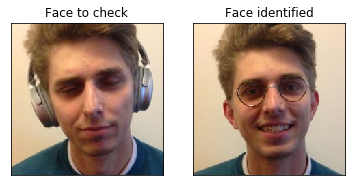

✔️ You've been recognized! You might be Arthur B . Access authorized! Please go find your beloved!


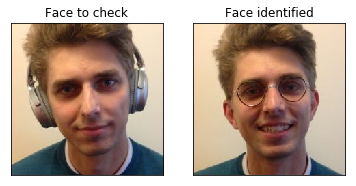

✔️ You've been recognized! You might be Arthur B . Access authorized! Please go find your beloved!


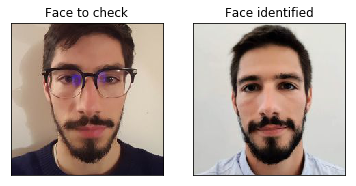

✔️ You've been recognized! You might be Benjamin F . Access authorized! Please go find your beloved!


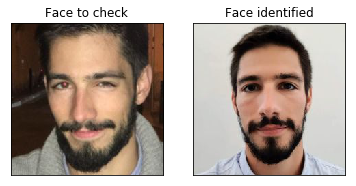

✔️ You've been recognized! You might be Benjamin F . Access authorized! Please go find your beloved!


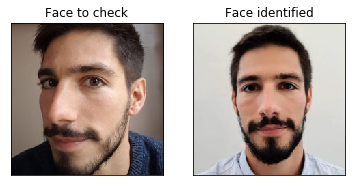

✔️ You've been recognized! You might be Benjamin F . Access authorized! Please go find your beloved!


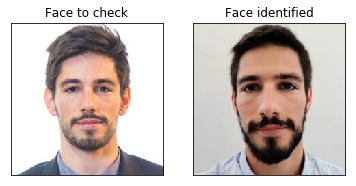

✔️ You've been recognized! You might be Benjamin F . Access authorized! Please go find your beloved!


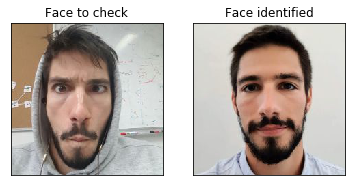

✔️ You've been recognized! You might be Benjamin F . Access authorized! Please go find your beloved!


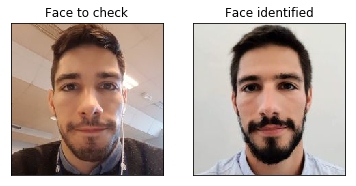

✔️ You've been recognized! You might be Benjamin F . Access authorized! Please go find your beloved!


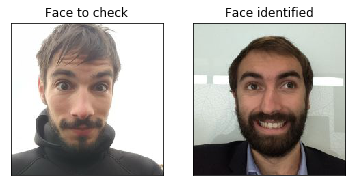

✔️ You've been recognized! You might be Matthias D . Access authorized! Please go find your beloved!


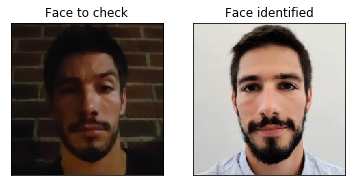

✔️ You've been recognized! You might be Benjamin F . Access authorized! Please go find your beloved!


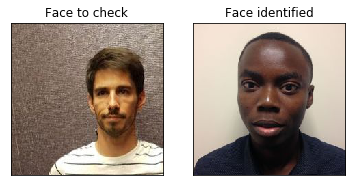

✔️ You've been recognized! You might be Charles D . Access authorized! Please go find your beloved!


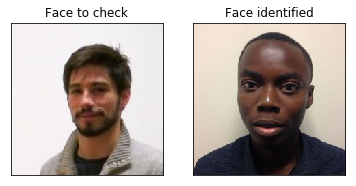

✔️ You've been recognized! You might be Charles D . Access authorized! Please go find your beloved!


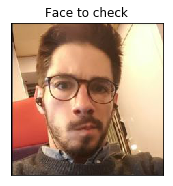

❌ You are not similar to anyone in our database of reference images. Access unauthorized! Get out of here!


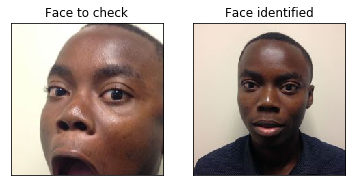

✔️ You've been recognized! You might be Charles D . Access authorized! Please go find your beloved!


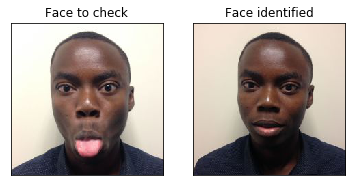

✔️ You've been recognized! You might be Charles D . Access authorized! Please go find your beloved!


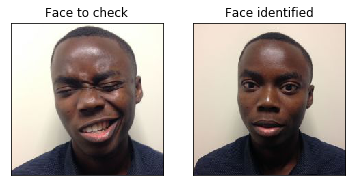

✔️ You've been recognized! You might be Charles D . Access authorized! Please go find your beloved!


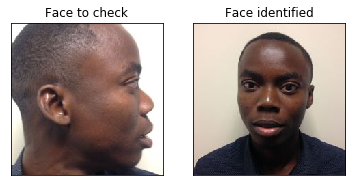

✔️ You've been recognized! You might be Charles D . Access authorized! Please go find your beloved!


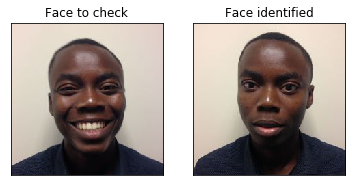

✔️ You've been recognized! You might be Charles D . Access authorized! Please go find your beloved!


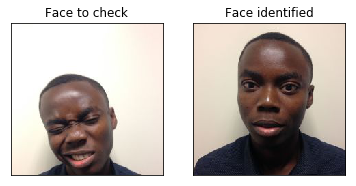

✔️ You've been recognized! You might be Charles D . Access authorized! Please go find your beloved!


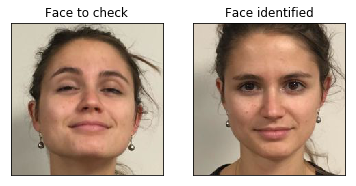

✔️ You've been recognized! You might be Kimmmmmmmm M . Access authorized! Please go find your beloved!


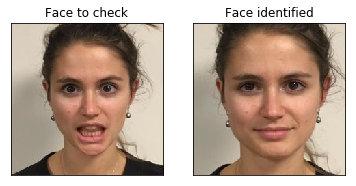

✔️ You've been recognized! You might be Kimmmmmmmm M . Access authorized! Please go find your beloved!


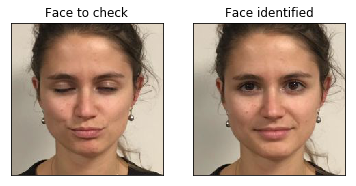

✔️ You've been recognized! You might be Kimmmmmmmm M . Access authorized! Please go find your beloved!


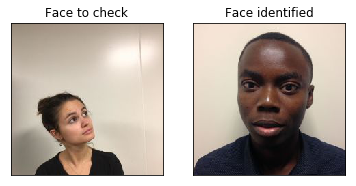

✔️ You've been recognized! You might be Charles D . Access authorized! Please go find your beloved!


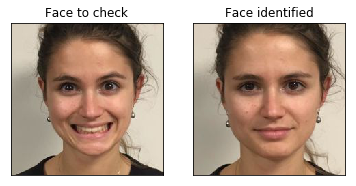

✔️ You've been recognized! You might be Kimmmmmmmm M . Access authorized! Please go find your beloved!


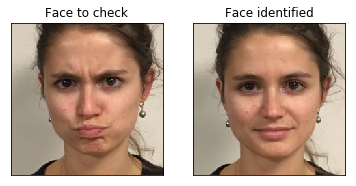

✔️ You've been recognized! You might be Kimmmmmmmm M . Access authorized! Please go find your beloved!


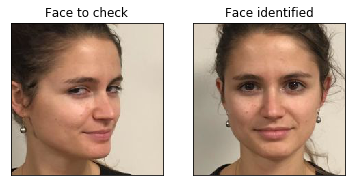

✔️ You've been recognized! You might be Kimmmmmmmm M . Access authorized! Please go find your beloved!


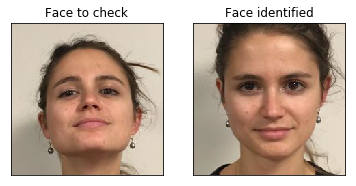

✔️ You've been recognized! You might be Kimmmmmmmm M . Access authorized! Please go find your beloved!


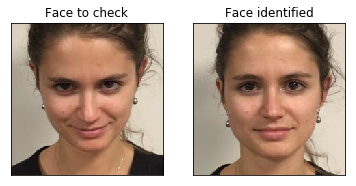

✔️ You've been recognized! You might be Kimmmmmmmm M . Access authorized! Please go find your beloved!


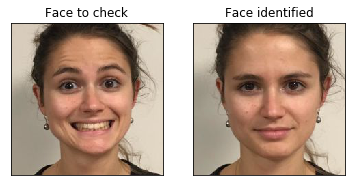

✔️ You've been recognized! You might be Kimmmmmmmm M . Access authorized! Please go find your beloved!


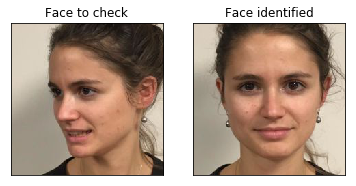

✔️ You've been recognized! You might be Kimmmmmmmm M . Access authorized! Please go find your beloved!


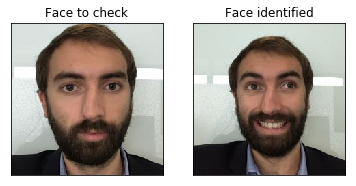

✔️ You've been recognized! You might be Matthias D . Access authorized! Please go find your beloved!


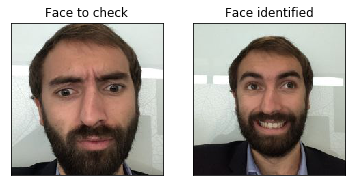

✔️ You've been recognized! You might be Matthias D . Access authorized! Please go find your beloved!


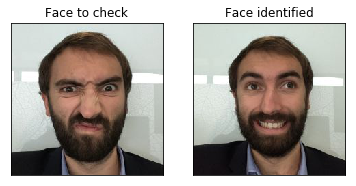

✔️ You've been recognized! You might be Matthias D . Access authorized! Please go find your beloved!


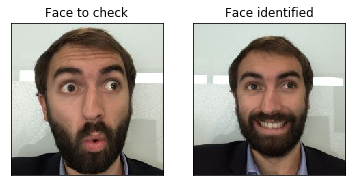

✔️ You've been recognized! You might be Matthias D . Access authorized! Please go find your beloved!


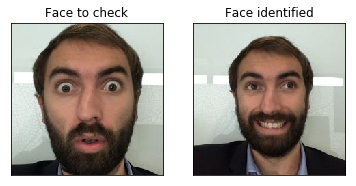

✔️ You've been recognized! You might be Matthias D . Access authorized! Please go find your beloved!


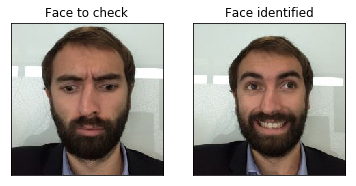

✔️ You've been recognized! You might be Matthias D . Access authorized! Please go find your beloved!


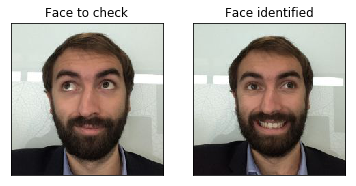

✔️ You've been recognized! You might be Matthias D . Access authorized! Please go find your beloved!


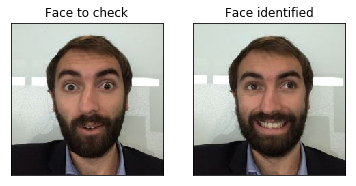

✔️ You've been recognized! You might be Matthias D . Access authorized! Please go find your beloved!


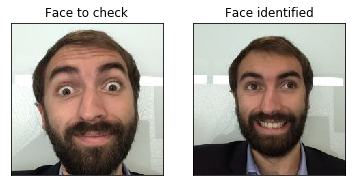

✔️ You've been recognized! You might be Matthias D . Access authorized! Please go find your beloved!


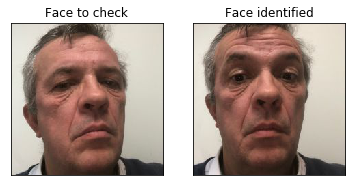

✔️ You've been recognized! You might be Olivier A . Access authorized! Please go find your beloved!


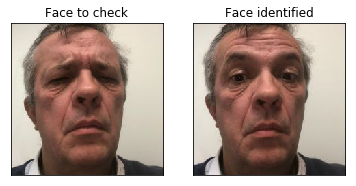

✔️ You've been recognized! You might be Olivier A . Access authorized! Please go find your beloved!


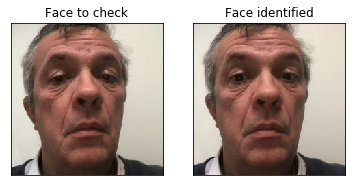

✔️ You've been recognized! You might be Olivier A . Access authorized! Please go find your beloved!


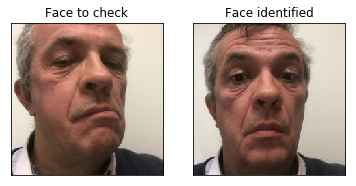

✔️ You've been recognized! You might be Olivier A . Access authorized! Please go find your beloved!


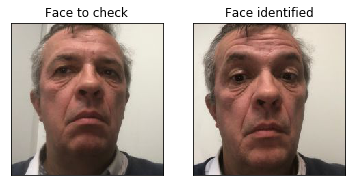

✔️ You've been recognized! You might be Olivier A . Access authorized! Please go find your beloved!


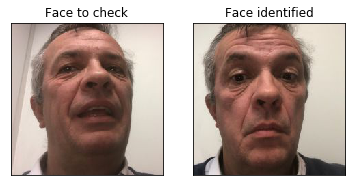

✔️ You've been recognized! You might be Olivier A . Access authorized! Please go find your beloved!


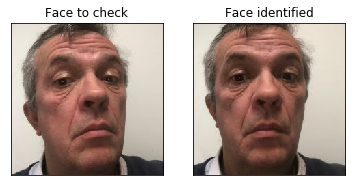

✔️ You've been recognized! You might be Olivier A . Access authorized! Please go find your beloved!


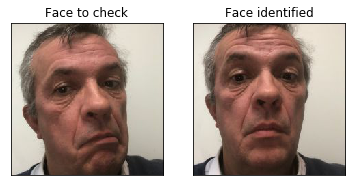

✔️ You've been recognized! You might be Olivier A . Access authorized! Please go find your beloved!


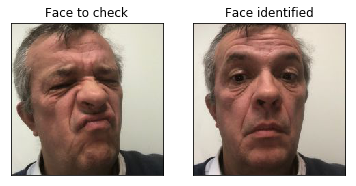

✔️ You've been recognized! You might be Olivier A . Access authorized! Please go find your beloved!


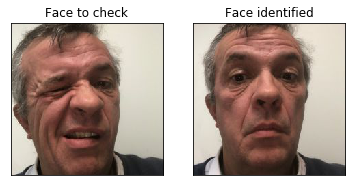

✔️ You've been recognized! You might be Olivier A . Access authorized! Please go find your beloved!


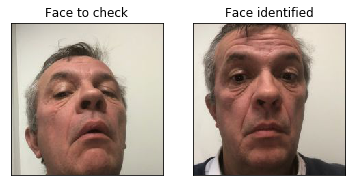

✔️ You've been recognized! You might be Olivier A . Access authorized! Please go find your beloved!


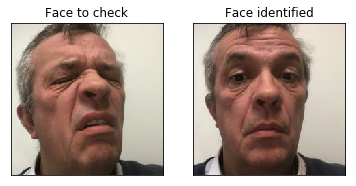

✔️ You've been recognized! You might be Olivier A . Access authorized! Please go find your beloved!


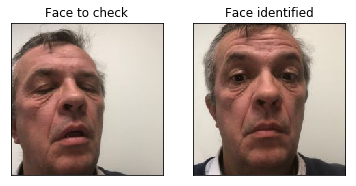

✔️ You've been recognized! You might be Olivier A . Access authorized! Please go find your beloved!


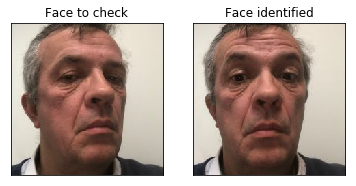

✔️ You've been recognized! You might be Olivier A . Access authorized! Please go find your beloved!


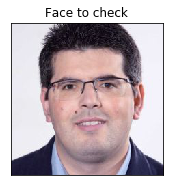

❌ You are not similar to anyone in our database of reference images. Access unauthorized! Get out of here!


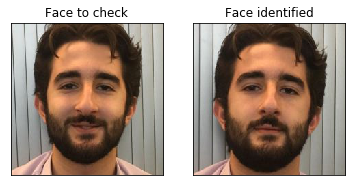

✔️ You've been recognized! You might be Zakaria B . Access authorized! Please go find your beloved!


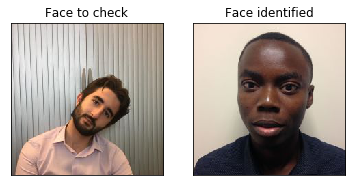

✔️ You've been recognized! You might be Charles D . Access authorized! Please go find your beloved!


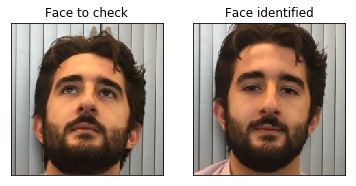

✔️ You've been recognized! You might be Zakaria B . Access authorized! Please go find your beloved!


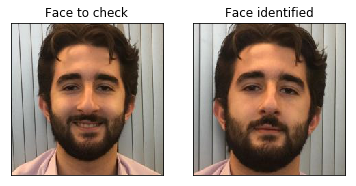

✔️ You've been recognized! You might be Zakaria B . Access authorized! Please go find your beloved!


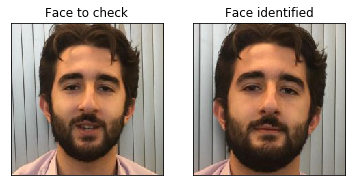

✔️ You've been recognized! You might be Zakaria B . Access authorized! Please go find your beloved!


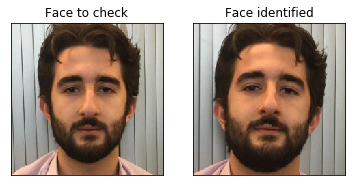

✔️ You've been recognized! You might be Zakaria B . Access authorized! Please go find your beloved!


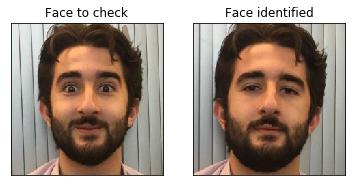

✔️ You've been recognized! You might be Zakaria B . Access authorized! Please go find your beloved!


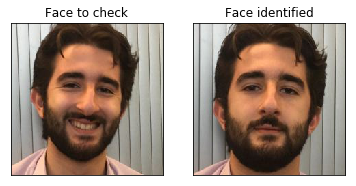

✔️ You've been recognized! You might be Zakaria B . Access authorized! Please go find your beloved!


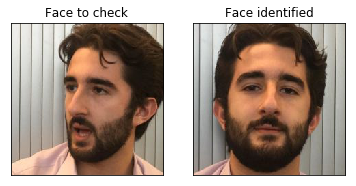

✔️ You've been recognized! You might be Zakaria B . Access authorized! Please go find your beloved!


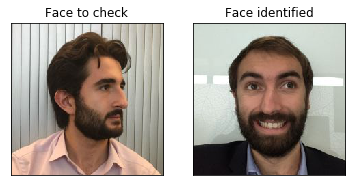

✔️ You've been recognized! You might be Matthias D . Access authorized! Please go find your beloved!


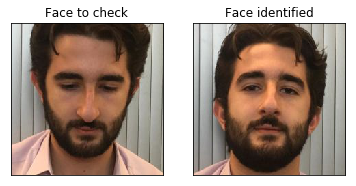

✔️ You've been recognized! You might be Zakaria B . Access authorized! Please go find your beloved!


In [309]:
# now let's check several faces
for img in os.listdir("./images/processed/test/"): # in test_person :
    img_path = "./images/processed/test/"+ img
    face_identification(img_path,ref_db,resnet50_vggface2)

In [285]:
nb_faces_scanned = 0
nb_faces_authorized_good_reco = 0
nb_faces_authorized_bad_reco = 0

for img in os.listdir("./images/processed/test/"):
    img_path = "./images/processed/test/"+ img
    nb_faces_scanned += 1
    
    if face_identification(img_path,ref_db,resnet50_vggface2,plot=False)[2]:
        if face_identification(img_path,ref_db,resnet50_vggface2,plot=False)[3]:
            nb_faces_authorized_good_reco += 1
        else:
            nb_faces_authorized_bad_reco += 1
    
print("Our facial recognition system with EUCLIDIAN DISTANCE has :")
print("- scanned " +str(nb_faces_scanned)+" faces")
print("- authorized access when successfully recognizing faces " + str(nb_faces_success_reco)+ " faces")
print("- authorized access when badly recognizing faces " + str(nb_faces_authorized_bad_reco)+ " faces")
print("- unauthorized access (and so badly recognizing faces) " + str(nb_faces_scanned-nb_faces_success_reco-nb_faces_authorized_bad_reco)+ " faces")

Our facial recognition system with EUCLIDIAN DISTANCE has :
- scanned 111 faces
- authorized access when successfully recognizing faces 94 faces
- authorized access when badly recognizing faces 6 faces
- authorized access when badly recognizing faces 11 faces


In [310]:
import pandas as pd

def create_empty_df():
    df = pd.DataFrame()
    header_list = [
                    'name',
                    'nb_faces_scanned',
                    'nb_access_OK_reco_OK',
                    'nb_access_OK_reco_KO',
                    'nb_access_KO_reco_KO',
                  ]
    df = df.reindex(columns = header_list)
    return df


Just to do some statistics over our FR, run the next cells. It's gonna take some time!

In [311]:
df = create_empty_df()

for name in names:
    nb_faces_scanned = 0
    nb_faces_authorized_good_reco = 0
    nb_faces_authorized_bad_reco = 0
    
    for img in [f for f in os.listdir("./images/processed/test/") if name in f]:
        img_path = "./images/processed/test/"+ img
        nb_faces_scanned += 1
        if face_identification(img_path,ref_db,resnet50_vggface2,plot=False)[2]:
            if face_identification(img_path,ref_db,resnet50_vggface2,plot=False)[3]:
                nb_faces_authorized_good_reco += 1
            else:
                nb_faces_authorized_bad_reco += 1
            
    df = df.append({
            'name':name,
            'nb_faces_scanned':nb_faces_scanned,
            'nb_access_OK_reco_OK':nb_faces_authorized_good_reco,
            'nb_access_OK_reco_KO':nb_faces_authorized_bad_reco,
            'nb_access_KO_reco_KO':nb_faces_scanned-nb_faces_authorized_good_reco-nb_faces_authorized_bad_reco
       }, 
       ignore_index=True)


In [312]:
# print the recap array
df

,name,nb_faces_scanned,nb_access_OK_reco_OK,nb_access_OK_reco_KO,nb_access_KO_reco_KO
0,adrien_r_,17.0,17.0,0.0,0.0
1,adrien_s_,11.0,11.0,0.0,0.0
2,ambroise_p_,11.0,11.0,0.0,0.0
3,arthur_b_,10.0,10.0,0.0,0.0
4,benjamin_f_,11.0,7.0,3.0,1.0
5,charles_d_,6.0,6.0,0.0,0.0
6,kimmmmmmmm_m_,11.0,10.0,1.0,0.0
7,matthias_d_,9.0,9.0,0.0,0.0
8,olivier_a_,14.0,14.0,0.0,0.0
9,zakaria_b_,11.0,9.0,2.0,0.0


Congrats!! We've got a very nice face recognition system that actually works pretty well! :)

**BONUS 1**

As you might have already seen, our face detector did not crop very well all faces. <br>
1) Try to output the paths of the concerned pictures. <br>
2) Duplicate them and crop them manually to focus only on the face and compare the distances with the encoding of the image of reference. You'll how important is to detect face to focus only on distingual personal information

**BONUS 2:** Improve our face recognition system with several pictures of Data Scientists


Assuming we have now several pictures of Data Scientists, you're free to enhance the algorithm. ;)
1) <br>
2) Apply the face_verification on Ambroise 

**BONUS 3:** Analyse impact & distance accuracy 

1) Code cosine, L1 or Chi2 distances. <br>
2) Compare all these distances (in addition to Euclidian one) on faces. See if some are more accurate than other ones.<br>
3) Particularly try to apply face_verification on images and output an array showing **for each distance** the global number of
- authorized access when successfully recognizing faces
- authorized access when badly recognizing faces 
- unauthorized access (and so badly recognizing faces

In [147]:
def face_verification(img_path, ref_img_path, model, distance):
    
    return verification, recognition_rate